# Week 8 Lab Exercise — ARIA v5.0: The Matai'an Three-Act Auditor
# 第八週課堂練習 — ARIA v5.0：馬太鞍三幕稽核器

**Guided lab worksheet** — follow along with the instructor's Demo notebook and fill in the TODO cells.
**引導式練習** — 跟著老師的 Demo 操作，完成 TODO 標記的程式碼。

**Case / 案例**: 2025 Matai'an Creek Barrier Lake Event（馬太鞍溪堰塞湖事件）

---

### Class rhythm / 課程節奏

| Phase / 階段 | Content / 內容 | Cells | Time / 時間 |
|---|---|---|---|
| **Lab 1** | Spectral Detective 光譜偵探 | [S1]–[S6] | 35 min |
| **Lab 2** | Three-Act Audit 三幕稽核 | [S7]–[S15] | 50 min |


## Lab 1 — Environment + Three-Act STAC Scene Selection
## Lab 1 — 環境設定 + 三幕 STAC 影像選擇


In [11]:
# [S1] Environment setup — complete version
import os
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

import pystac_client
import planetary_computer as pc
import stackstac
import rioxarray as rxr
import xarray as xr
import rasterio
from pyproj import Transformer

# Optional: read .env if python-dotenv is installed
try:
    from dotenv import load_dotenv
    load_dotenv()
    print("✅ .env loaded")
except Exception:
    print("ℹ️ python-dotenv not installed, using current environment / notebook defaults")

# Font setup for Traditional Chinese
plt.rcParams["font.sans-serif"] = ["Microsoft JhengHei", "PingFang TC", "Noto Sans CJK TC", "sans-serif"]
plt.rcParams["axes.unicode_minus"] = False

# ---------- Config ----------
STAC_ENDPOINT = os.getenv("STAC_ENDPOINT", "https://planetarycomputer.microsoft.com/api/stac/v1")
S2_COLLECTION = os.getenv("S2_COLLECTION", "sentinel-2-l2a")
TARGET_EPSG = int(os.getenv("TARGET_EPSG", "32651"))
S2_BANDS = os.getenv("S2_BANDS", "B02,B03,B04,B08,B11,B12").split(",")

_bbox_str = os.getenv("MATAIAN_BBOX", "121.28,23.56,121.52,23.76")
MATAIAN_BBOX = [float(x) for x in _bbox_str.split(",")]

PRE_RANGE = f'{os.getenv("PRE_EVENT_START", "2025-06-01")}/{os.getenv("PRE_EVENT_END", "2025-07-15")}'
MID_RANGE = f'{os.getenv("MID_EVENT_START", "2025-08-01")}/{os.getenv("MID_EVENT_END", "2025-09-20")}'
POST_RANGE = f'{os.getenv("POST_EVENT_START", "2025-09-25")}/{os.getenv("POST_EVENT_END", "2025-11-15")}'

WANTED_BANDS = S2_BANDS
OUTPUT_DIR = Path("outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

PRE_ITEM_ID = "FILL_IN_AFTER_QA"
MID_ITEM_ID = "FILL_IN_AFTER_QA"
POST_ITEM_ID = "FILL_IN_AFTER_QA"

catalog = pystac_client.Client.open(STAC_ENDPOINT, modifier=pc.sign_inplace)

def robust_search(bbox, datetime_range, cloud_max=30, max_items=60, tries=3, collection=S2_COLLECTION):
    """Retryable STAC search with client-side cloud filtering."""
    last_err = None
    for attempt in range(tries):
        try:
            search = catalog.search(
                collections=[collection],
                bbox=bbox,
                datetime=datetime_range,
                max_items=max_items,
            )
            items = list(search.items())
            items = [i for i in items if i.properties.get("eo:cloud_cover", 100) <= cloud_max]
            items.sort(key=lambda i: (i.properties.get("eo:cloud_cover", 100), i.properties.get("datetime", "")))
            if len(items) == 0:
                raise RuntimeError(f"No STAC items found for {datetime_range} with cloud_max={cloud_max}")
            return items
        except Exception as e:
            last_err = e
            wait = 2 ** attempt
            print(f"Search attempt {attempt+1} failed: {e}. Retrying in {wait}s...")
            time.sleep(wait)
    raise RuntimeError(f"STAC search failed after {tries} tries: {last_err}")

def preview_item_visual(item, ax, title_prefix=""):
    """Quick RGB preview using the Sentinel-2 visual asset."""
    signed_visual = pc.sign(item).assets["visual"].href
    with rxr.open_rasterio(signed_visual, overview_level=3, masked=True) as img:
        rgb = img.isel(band=slice(0, 3)).transpose("y", "x", "band").values.astype("float32")
        rgb = np.nan_to_num(rgb, nan=0.0)
        if np.nanmax(rgb) > 1.5:
            rgb = rgb / 255.0
        ax.imshow(rgb)
    dt = str(item.properties.get("datetime", ""))[:10]
    cc = item.properties.get("eo:cloud_cover", "N/A")
    ax.set_title(f"{title_prefix}{item.id}\nCloud: {cc}% | {dt}", fontsize=10)
    ax.axis("off")

def stream_cube(item, bands=None, bbox=None, epsg=None, resolution=10, chunksize=1024):
    """Read a freshly signed Sentinel-2 item as a surface reflectance cube."""
    if bands is None:
        bands = os.getenv("S2_BANDS", "B02,B03,B04,B08,B11,B12").split(",")
    if bbox is None:
        bbox = MATAIAN_BBOX
    if epsg is None:
        epsg = int(os.getenv("TARGET_EPSG", "32651"))

    signed = pc.sign(item)

    cube = stackstac.stack(
        [signed],
        assets=bands,
        epsg=int(epsg),
        resolution=resolution,
        bounds_latlon=tuple(bbox),
        chunksize=chunksize,
        dtype="float32",
        fill_value=np.float32(np.nan),   # 這裡要改
        rescale=False,
    ).squeeze("time", drop=True) / 10000.0

    return cube.astype("float32")

def composite_stretched(cube, r="B04", g="B03", b="B02", lo=2, hi=98):
    """Per-channel percentile stretch for display only."""
    r_arr = cube.sel(band=r).compute().values
    g_arr = cube.sel(band=g).compute().values
    b_arr = cube.sel(band=b).compute().values
    rgb = np.stack([r_arr, g_arr, b_arr], axis=-1).astype("float32")
    out = np.zeros_like(rgb, dtype="float32")
    for k in range(3):
        p_lo, p_hi = np.nanpercentile(rgb[..., k], [lo, hi])
        denom = max(p_hi - p_lo, 1e-6)
        out[..., k] = np.clip((rgb[..., k] - p_lo) / denom, 0, 1)
    return out

def save_local_preview(cube, out_path, downsample=4):
    """Save a coarsened RGB preview to disk for later plotting."""
    cube_preview = cube.coarsen(x=downsample, y=downsample, boundary="trim").mean()
    tci_preview = composite_stretched(cube_preview, "B04", "B03", "B02")
    plt.imsave(out_path, tci_preview)
    return out_path

def pixel_area_km2(mask_da, resolution=10):
    """Boolean mask area in km² assuming square pixels."""
    return float(np.nansum(mask_da.astype("uint8").values)) * (resolution * resolution) / 1e6

def add_mask_overlay(ax, mask_da, cmap="Blues", alpha=0.65):
    overlay = np.where(mask_da.values, 1.0, np.nan)
    ax.imshow(overlay, cmap=cmap, alpha=alpha, vmin=0, vmax=1)

print("✅ Environment ready")
print("STAC_ENDPOINT:", STAC_ENDPOINT)
print("S2_COLLECTION:", S2_COLLECTION)
print("TARGET_EPSG:", TARGET_EPSG)
print("MATAIAN_BBOX:", MATAIAN_BBOX)
print("WANTED_BANDS:", WANTED_BANDS)


✅ .env loaded
✅ Environment ready
STAC_ENDPOINT: https://planetarycomputer.microsoft.com/api/stac/v1
S2_COLLECTION: sentinel-2-l2a
TARGET_EPSG: 32651
MATAIAN_BBOX: [121.28, 23.56, 121.52, 23.76]
WANTED_BANDS: ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']


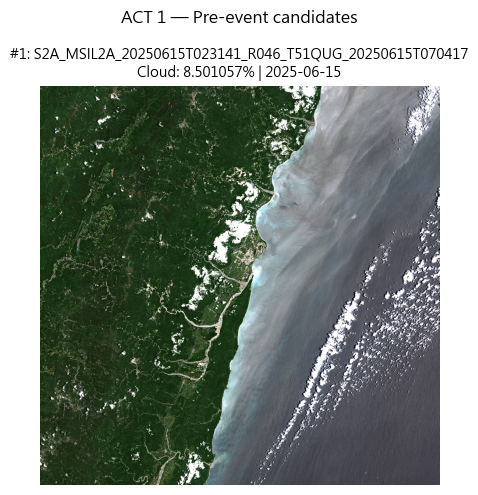

✅ Selected pre-event scene: S2A_MSIL2A_20250615T023141_R046_T51QUG_20250615T070417
Date: 2025-06-15T02:31:41.024000Z
Cloud cover: 8.501057%
Candidates found: 1


In [12]:
# [S2] ACT 1 — Pre-event STAC search (Jun 2025, before barrier-lake formation)
items_pre = robust_search(MATAIAN_BBOX, PRE_RANGE, cloud_max=int(os.getenv("S2_CLOUD_MAX", "20")))

n = min(len(items_pre), 3)
fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
if n == 1:
    axes = [axes]

for i, (item, ax) in enumerate(zip(items_pre[:n], axes), start=1):
    preview_item_visual(item, ax, title_prefix=f"#{i}: ")

plt.suptitle("ACT 1 — Pre-event candidates")
plt.tight_layout()
plt.show()

pre_item = items_pre[0]
PRE_ITEM_ID = pre_item.id

print(f"✅ Selected pre-event scene: {PRE_ITEM_ID}")
print(f"Date: {pre_item.properties.get('datetime', 'N/A')}")
print(f"Cloud cover: {pre_item.properties.get('eo:cloud_cover', 'N/A')}%")
print(f"Candidates found: {len(items_pre)}")

### ✏️ Discussion / 討論（Act 1 — Pre）
Why did you pick this Pre-event scene? Consider cloud cover **over the Matai'an valley** specifically.
為什麼選這張事件前影像？特別注意馬太鞍谷地上方的雲量（不只是 tile 整體數字）。



Selected this June 15, 2025 scene because it has very low cloud cover (8.5%) and appears to have minimal cloud obstruction over the Matai'an valley itself, providing a clear baseline for forest and river conditions before the barrier lake formation.

選擇這張 2025 年 6 月 15 日的影像，因為雲量很低（8.5%），且馬太鞍谷地上方似乎沒有雲層遮蔽，能提供堰塞湖形成前森林和河川的清晰基準狀態。

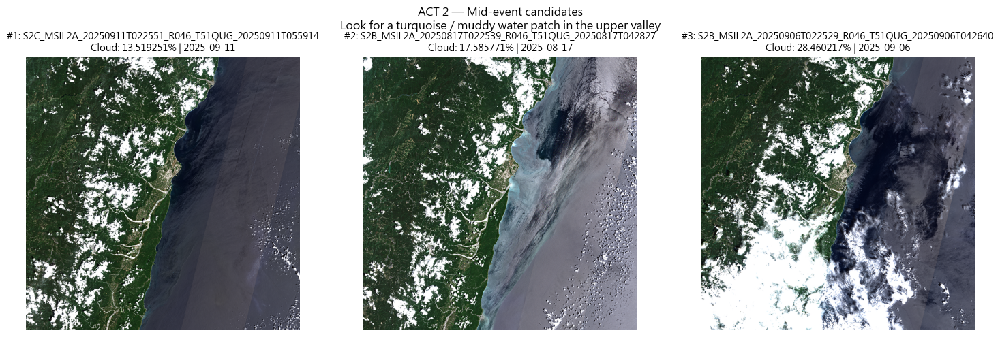

✅ Selected mid-event scene: S2C_MSIL2A_20250911T022551_R046_T51QUG_20250911T055914
Date: 2025-09-11T02:25:51.025000Z
Cloud cover: 13.519251%
Candidates found: 7


In [3]:
# [S3] ACT 2 — Mid-event STAC search (Aug–Sep 2025, lake present before breach)
items_mid = robust_search(MATAIAN_BBOX, MID_RANGE, cloud_max=40)

n = min(len(items_mid), 3)
fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
if n == 1:
    axes = [axes]

for i, (item, ax) in enumerate(zip(items_mid[:n], axes), start=1):
    preview_item_visual(item, ax, title_prefix=f"#{i}: ")

plt.suptitle("ACT 2 — Mid-event candidates\nLook for a turquoise / muddy water patch in the upper valley")
plt.tight_layout()
plt.show()

mid_item = items_mid[0]
MID_ITEM_ID = mid_item.id

print(f"✅ Selected mid-event scene: {MID_ITEM_ID}")
print(f"Date: {mid_item.properties.get('datetime', 'N/A')}")
print(f"Cloud cover: {mid_item.properties.get('eo:cloud_cover', 'N/A')}%")
print(f"Candidates found: {len(items_mid)}")

### ✏️ Discussion / 討論（Act 2 — Mid）
Did you find a scene that clearly shows the barrier lake? Why did you pick this one?
你找到了清楚顯示堰塞湖的影像嗎？為什麼選這一張？



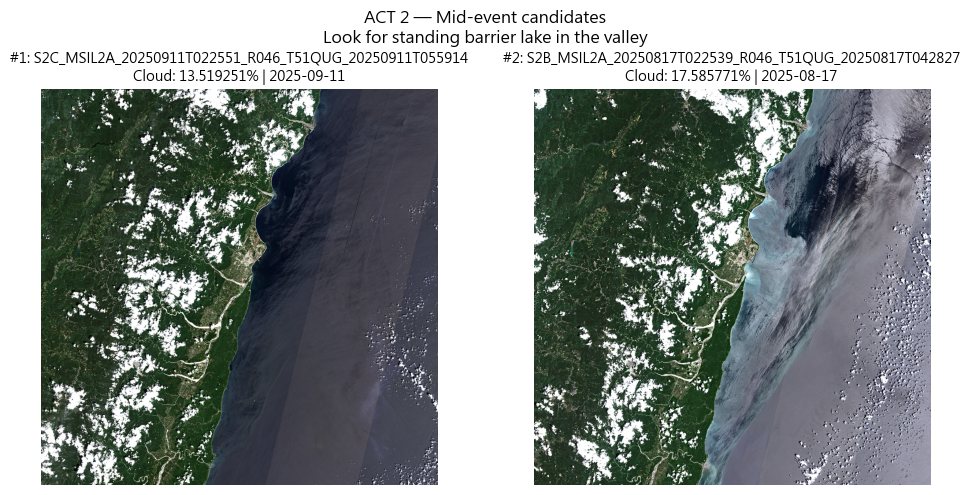

✅ Selected mid-event scene: S2C_MSIL2A_20250911T022551_R046_T51QUG_20250911T055914
Date: 2025-09-11T02:25:51.025000Z
Cloud cover: 13.519251%
Candidates found: 2


In [20]:
# [S3] ACT 2 — Mid-event STAC search (during barrier-lake existence)
items_mid = robust_search(
    MATAIAN_BBOX,
    MID_RANGE,
    cloud_max=int(os.getenv("S2_CLOUD_MAX", "20"))
)

if len(items_mid) == 0:
    raise ValueError("No mid-event Sentinel-2 scenes found. Try relaxing cloud threshold or expanding MID_RANGE.")

# 依雲量排序，優先選雲量最低
items_mid = sorted(items_mid, key=lambda item: item.properties.get("eo:cloud_cover", 999))

n = min(len(items_mid), 3)
fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
if n == 1:
    axes = [axes]

for i, (item, ax) in enumerate(zip(items_mid[:n], axes), start=1):
    preview_item_visual(item, ax, title_prefix=f"#{i}: ")

plt.suptitle("ACT 2 — Mid-event candidates\nLook for standing barrier lake in the valley")
plt.tight_layout()
plt.show()

mid_item = items_mid[0]
MID_ITEM_ID = mid_item.id

print(f"✅ Selected mid-event scene: {MID_ITEM_ID}")
print(f"Date: {mid_item.properties.get('datetime', 'N/A')}")
print(f"Cloud cover: {mid_item.properties.get('eo:cloud_cover', 'N/A')}%")
print(f"Candidates found: {len(items_mid)}")

### ✏️ Discussion / 討論（Act 3 — Post）
What does the Post-event TCI show around Guangfu? Can you see evidence of the debris flow?
事件後的 TCI 在光復周邊顯示了什麼？你看得到土石流的證據嗎？



The post-event TCI shows extensive fresh sediment deposits covering agricultural fields and areas around Guangfu, with light brown/tan sediment spreading across the landscape, providing clear evidence of debris flow from the breached barrier lake.

事件後的 TCI 顯示光復周邊的農田和區域被大量新沉積物覆蓋，淺棕色/棕褐色沉積物散布在景觀中，提供了堰塞湖潰決後土石流的明確證據。

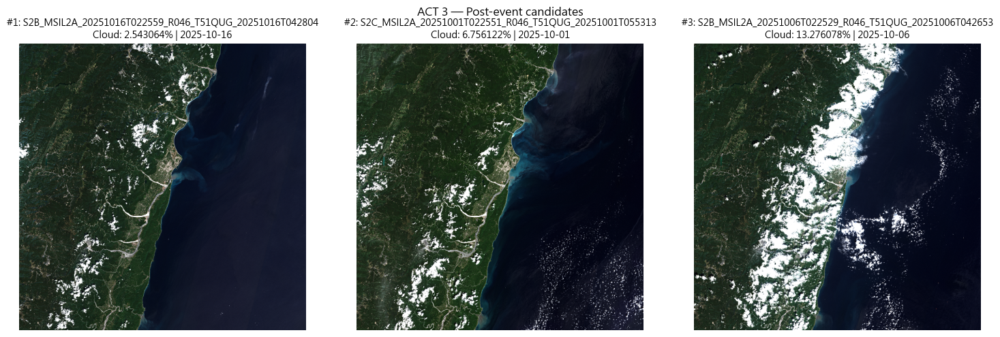

✅ Selected post-event scene: S2B_MSIL2A_20251016T022559_R046_T51QUG_20251016T042804
Date: 2025-10-16T02:25:59.024000Z
Cloud cover: 2.543064%
Candidates found: 5


In [16]:
# [S3] ACT 3 — Post-event STAC search (after barrier-lake drainage)
items_post = robust_search(
    MATAIAN_BBOX,
    POST_RANGE,
    cloud_max=int(os.getenv("S2_CLOUD_MAX", "20"))
)

if len(items_post) == 0:
    raise ValueError("No post-event Sentinel-2 scenes found. Try relaxing cloud threshold or expanding POST_RANGE.")

# 依雲量排序，優先選雲量最低
items_post = sorted(
    items_post,
    key=lambda item: item.properties.get("eo:cloud_cover", 999)
)

n = min(len(items_post), 3)
fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
if n == 1:
    axes = [axes]

for i, (item, ax) in enumerate(zip(items_post[:n], axes), start=1):
    preview_item_visual(item, ax, title_prefix=f"#{i}: ")

plt.suptitle("ACT 3 — Post-event candidates")
plt.tight_layout()
plt.show()

post_item = items_post[0]
POST_ITEM_ID = post_item.id

print(f"✅ Selected post-event scene: {POST_ITEM_ID}")
print(f"Date: {post_item.properties.get('datetime', 'N/A')}")
print(f"Cloud cover: {post_item.properties.get('eo:cloud_cover', 'N/A')}%")
print(f"Candidates found: {len(items_post)}")

## Stream the Three Cubes / 串流三個立方體


In [21]:
# [S5] Stream the three cubes
cube_pre = stream_cube(pre_item)
cube_mid = stream_cube(mid_item)
cube_post = stream_cube(post_item)

print("✅ Cubes loaded")
print("cube_pre :", cube_pre.shape, cube_pre.rio.crs)
print("cube_mid :", cube_mid.shape, cube_mid.rio.crs)
print("cube_post:", cube_post.shape, cube_post.rio.crs)

# Quick read test to catch expired URLs early
for label, cube in [("pre", cube_pre), ("mid", cube_mid), ("post", cube_post)]:
    try:
        _ = cube.sel(band="B04").isel(x=slice(0, 128), y=slice(0, 128)).compute()
        print(f"✅ cube_{label} read test passed")
    except Exception as e:
        print(f"⚠️ cube_{label} read test failed: {e}")

# Save a local preview for the post-event background so later cells do not depend on stale signed URLs
try:
    preview_path = save_local_preview(cube_post, OUTPUT_DIR / "post_rgb_preview.png", downsample=4)
    print(f"✅ Saved local preview: {preview_path}")
except Exception as e:
    print(f"⚠️ Failed to save local post preview: {e}")


✅ Cubes loaded
cube_pre : (6, 2243, 2474) EPSG:32651
cube_mid : (6, 2243, 2474) EPSG:32651
cube_post: (6, 2243, 2474) EPSG:32651
✅ cube_pre read test passed
✅ cube_mid read test passed
✅ cube_post read test passed
✅ Saved local preview: outputs\post_rgb_preview.png


# [S6] Four reusable change metric functions


In [22]:
# [S6] Four reusable change metric functions
def nir_drop(pre, post):
    # return pre.sel(band="B08") - post.sel(band="B08")
    return pre.sel(band="B08") - post.sel(band="B08")

def swir_post(post):
    # return post.sel(band="B12")
    return post.sel(band="B12")

def bsi(cube):
    # BSI = ((B11 + B04) - (B08 + B02)) / ((B11 + B04) + (B08 + B02))
    return ((cube.sel(band="B11") + cube.sel(band="B04")) - 
            (cube.sel(band="B08") + cube.sel(band="B02"))) / \
           ((cube.sel(band="B11") + cube.sel(band="B04")) + 
            (cube.sel(band="B08") + cube.sel(band="B02")))

def bsi_change(pre, post):
    # return bsi(post) - bsi(pre)
    return bsi(post) - bsi(pre)

def ndvi(cube):
    # (B08 - B04) / (B08 + B04)
    return (cube.sel(band="B08") - cube.sel(band="B04")) / \
           (cube.sel(band="B08") + cube.sel(band="B04"))

def ndvi_change(pre, post):
    # return ndvi(pre) - ndvi(post)
    return ndvi(pre) - ndvi(post)

## Lab 2 — Three Detection Masks / 三張偵測遮罩

### C1. Barrier lake mask / 堰塞湖遮罩（Pre → Mid）

Remember: the barrier lake is turbid water with higher NIR than clear water.
提醒：堰塞湖是高濁度水體，NIR 比清水高。


,nir_mid_threshold,lake_area_km2
0,0.12,0.5294
1,0.15,1.0462
2,0.18,1.2613


✅ Selected NIR mid threshold: 0.15
✅ Lake area: 1.046 km²


C:\Users\User\AppData\Local\Temp\ipykernel_812\2241224279.py:58: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  plt.tight_layout()
C:\Users\User\AppData\Local\Temp\ipykernel_812\2241224279.py:59: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  plt.savefig(OUTPUT_DIR / "07_lake_mask.png", dpi=150, bbox_inches="tight")
c:\Users\User\anaconda3\envs\geo-risk\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  fig.canvas.print_figure(bytes_io, **kw)


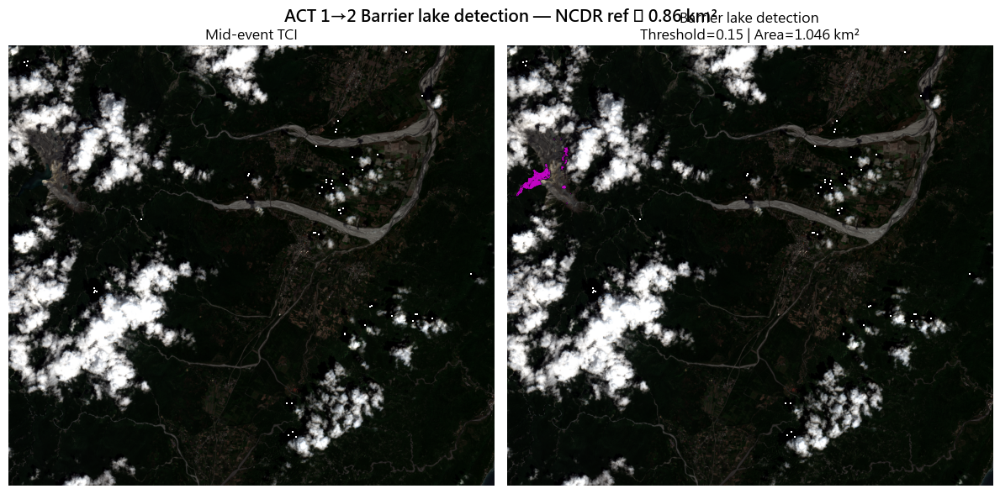

In [23]:
# [S7] Barrier lake detection
nir_pre = cube_pre.sel(band="B08")
nir_mid = cube_mid.sel(band="B08")
blue_mid = cube_mid.sel(band="B02")
green_mid = cube_mid.sel(band="B03")

# Restrict to upper-valley / western side to reduce noise
tf = Transformer.from_crs("EPSG:4326", cube_mid.rio.crs, always_xy=True)
x_gate, _ = tf.transform(121.33, 23.69)
spatial_gate = cube_mid.x < x_gate

thresholds = [0.12, 0.15, 0.18]
lake_results = []

for nir_mid_thresh in thresholds:
    candidate = (
        (nir_pre > 0.25) &
        (nir_mid < nir_mid_thresh) &
        (blue_mid > 0.03) &
        (green_mid > nir_mid) &
        spatial_gate
    )
    lake_results.append({
        "nir_mid_threshold": nir_mid_thresh,
        "lake_area_km2": pixel_area_km2(candidate)
    })

lake_results_df = pd.DataFrame(lake_results)
display(lake_results_df)

best_result = min(lake_results, key=lambda d: abs(d["lake_area_km2"] - 0.86))
best_threshold = best_result["nir_mid_threshold"]

lake_mask = (
    (nir_pre > 0.25) &
    (nir_mid < best_threshold) &
    (blue_mid > 0.03) &
    (green_mid > nir_mid) &
    spatial_gate
)

lake_km2 = pixel_area_km2(lake_mask)
print(f"✅ Selected NIR mid threshold: {best_threshold:.2f}")
print(f"✅ Lake area: {lake_km2:.3f} km²")

tci_mid = composite_stretched(cube_mid, "B04", "B03", "B02")
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(tci_mid)
axes[0].set_title("Mid-event TCI")
axes[0].axis("off")

axes[1].imshow(tci_mid)
add_mask_overlay(axes[1], lake_mask, cmap="cool", alpha=0.75)
axes[1].set_title(f"Barrier lake detection\nThreshold={best_threshold:.2f} | Area={lake_km2:.3f} km²")
axes[1].axis("off")

plt.suptitle("ACT 1→2 Barrier lake detection — NCDR ref ≈ 0.86 km²", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "07_lake_mask.png", dpi=150, bbox_inches="tight")
plt.show()

### C2. Landslide source scar mask / 崩塌源區遮罩（Pre → Post）


In [24]:
# [S8] Ground truth collection -- 10 landslide + 10 stable forest points
landslide_truth = [
    (121.2915, 23.6972, "Y"),
    (121.2920, 23.6968, "Y"),
    (121.2918, 23.6975, "Y"),
    (121.2923, 23.6965, "Y"),
    (121.2912, 23.6970, "Y"),
    (121.2925, 23.6962, "Y"),
    (121.2917, 23.6963, "Y"),
    (121.2928, 23.6970, "Y"),
    (121.2910, 23.6968, "Y"),
    (121.2922, 23.6978, "Y"),
]

stable_truth = [
    (121.2950, 23.6980, "N"),
    (121.2890, 23.6985, "N"),
    (121.2940, 23.6950, "N"),
    (121.2885, 23.6955, "N"),
    (121.2935, 23.6990, "N"),
    (121.2900, 23.6995, "N"),
    (121.2960, 23.6975, "N"),
    (121.2875, 23.6970, "N"),
    (121.2945, 23.7000, "N"),
    (121.2895, 23.7005, "N"),
]

def create_gdf_from_points(points, crs="EPSG:4326"):
    return gpd.GeoDataFrame(
        {
            "label": [lab for _, _, lab in points],
            "lon": [lon for lon, _, _ in points],
            "lat": [lat for _, lat, _ in points],
        },
        geometry=[Point(lon, lat) for lon, lat, _ in points],
        crs=crs
    )

landslide_truth_gdf = create_gdf_from_points(landslide_truth).to_crs(cube_post.rio.crs)
stable_truth_gdf = create_gdf_from_points(stable_truth).to_crs(cube_post.rio.crs)

truth_gdf = pd.concat([landslide_truth_gdf, stable_truth_gdf], ignore_index=True)
truth_gdf = gpd.GeoDataFrame(truth_gdf, geometry="geometry", crs=cube_post.rio.crs)

print(f"✅ Truth points ready: {len(landslide_truth_gdf)} landslide + {len(stable_truth_gdf)} stable")
truth_gdf.head()

✅ Truth points ready: 10 landslide + 10 stable


,label,lon,lat,geometry
0,Y,121.2915,23.6972,POINT (325804.859 2621747.04)
1,Y,121.2920,23.6968,POINT (325855.317 2621702.131)
2,Y,121.2918,23.6975,POINT (325835.851 2621779.896)
3,Y,121.2923,23.6965,POINT (325885.513 2621668.542)
4,Y,121.2912,23.6970,POINT (325774 2621725.258)


,nir_drop_min,swir_post_min,tp,tn,fp,fn,accuracy,precision,recall,f1,area_km2,ls_nan_count,st_nan_count
0,0.10,0.20,0,10,0,10,0.5,0.0,0.0,0.0,23.3412,10,10
1,0.15,0.25,0,10,0,10,0.5,0.0,0.0,0.0,4.6586,10,10
2,0.20,0.30,0,10,0,10,0.5,0.0,0.0,0.0,0.5233,10,10
3,0.15,0.30,0,10,0,10,0.5,0.0,0.0,0.0,1.3361,10,10
4,0.20,0.25,0,10,0,10,0.5,0.0,0.0,0.0,2.0517,10,10


✅ Best threshold pair:
nir_drop_min      0.1000
swir_post_min     0.2000
tp                0.0000
tn               10.0000
fp                0.0000
fn               10.0000
accuracy          0.5000
precision         0.0000
recall            0.0000
f1                0.0000
area_km2         23.3412
ls_nan_count     10.0000
st_nan_count     10.0000
Name: 0, dtype: float64
✅ Landslide area: 23.341 km²


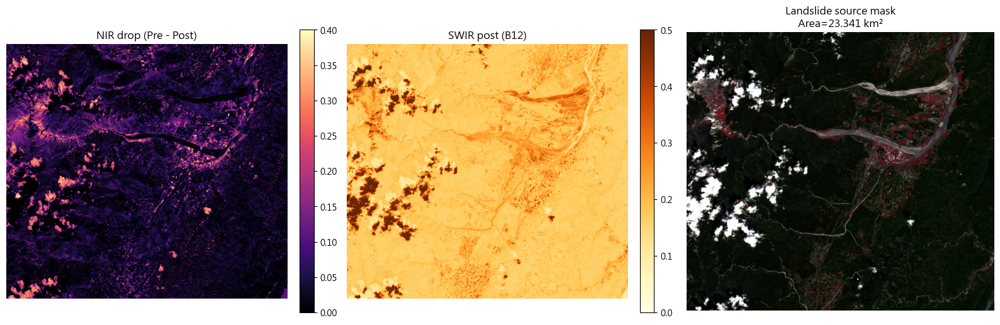

In [25]:
# [S8b] Threshold tuning -- 5 candidate pairs for the landslide source scar
candidate_thresholds = [
    (0.10, 0.20),
    (0.15, 0.25),
    (0.20, 0.30),
    (0.15, 0.30),
    (0.20, 0.25),
]

nir_drop_val = nir_drop(cube_pre, cube_post)
swir_post_val = swir_post(cube_post)
nir_pre_val = cube_pre.sel(band="B08")

def sample_mask_at_points(mask_da, points_gdf):
    sampled = []
    for geom in points_gdf.geometry:
        x = float(geom.x)
        y = float(geom.y)
        try:
            v = mask_da.sel(x=x, y=y, method="nearest").item()
            if pd.isna(v):
                v = np.nan
        except Exception:
            v = np.nan
        sampled.append(v)
    return np.array(sampled, dtype=float)

def clean_binary_samples(arr, fill_value=0):
    arr = np.asarray(arr, dtype=float)
    arr = np.where(np.isnan(arr), fill_value, arr)
    return arr.astype(int)

tuning_rows = []

for nir_drop_min, swir_post_min in candidate_thresholds:
    candidate_mask = (
        (nir_drop_val > nir_drop_min) &
        (swir_post_val > swir_post_min) &
        (nir_pre_val > 0.20) &
        (~lake_mask)
    )

    ls_samples_raw = sample_mask_at_points(candidate_mask, landslide_truth_gdf)
    st_samples_raw = sample_mask_at_points(candidate_mask, stable_truth_gdf)

    ls_samples = clean_binary_samples(ls_samples_raw, fill_value=0)
    st_samples = clean_binary_samples(st_samples_raw, fill_value=0)

    y_true = np.r_[
        np.ones(len(ls_samples), dtype=int),
        np.zeros(len(st_samples), dtype=int)
    ]
    y_pred = np.r_[ls_samples, st_samples]

    tp = int(((y_true == 1) & (y_pred == 1)).sum())
    tn = int(((y_true == 0) & (y_pred == 0)).sum())
    fp = int(((y_true == 0) & (y_pred == 1)).sum())
    fn = int(((y_true == 1) & (y_pred == 0)).sum())

    precision = tp / max(tp + fp, 1)
    recall = tp / max(tp + fn, 1)
    accuracy = (tp + tn) / max(len(y_true), 1)
    f1 = 2 * precision * recall / max(precision + recall, 1e-9)

    tuning_rows.append({
        "nir_drop_min": nir_drop_min,
        "swir_post_min": swir_post_min,
        "tp": tp,
        "tn": tn,
        "fp": fp,
        "fn": fn,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "area_km2": pixel_area_km2(candidate_mask),
        "ls_nan_count": int(np.isnan(ls_samples_raw).sum()),
        "st_nan_count": int(np.isnan(st_samples_raw).sum()),
    })

tuning_df = (
    pd.DataFrame(tuning_rows)
    .sort_values(["f1", "accuracy", "precision"], ascending=False)
    .reset_index(drop=True)
)
display(tuning_df)

best_ls = tuning_df.iloc[0]
print("✅ Best threshold pair:")
print(best_ls)

landslide_mask = (
    (nir_drop_val > float(best_ls["nir_drop_min"])) &
    (swir_post_val > float(best_ls["swir_post_min"])) &
    (nir_pre_val > 0.20) &
    (~lake_mask)
)

landslide_km2 = pixel_area_km2(landslide_mask)
print(f"✅ Landslide area: {landslide_km2:.3f} km²")

tci_post = composite_stretched(cube_post, "B04", "B03", "B02")
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

im0 = axes[0].imshow(nir_drop_val, cmap="magma", vmin=0, vmax=0.4)
axes[0].set_title("NIR drop (Pre - Post)")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(swir_post_val, cmap="YlOrBr", vmin=0, vmax=0.5)
axes[1].set_title("SWIR post (B12)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

axes[2].imshow(tci_post)
add_mask_overlay(axes[2], landslide_mask, cmap="Reds", alpha=0.75)
axes[2].set_title(f"Landslide source mask\nArea={landslide_km2:.3f} km²")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(OUTPUT_DIR / "08_landslide_mask.png", dpi=150, bbox_inches="tight")
plt.show()


### C3. Debris flow footprint mask / 土石流鋪面遮罩（Pre → Post, downstream only）


✅ Debris flow area: 3.221 km²


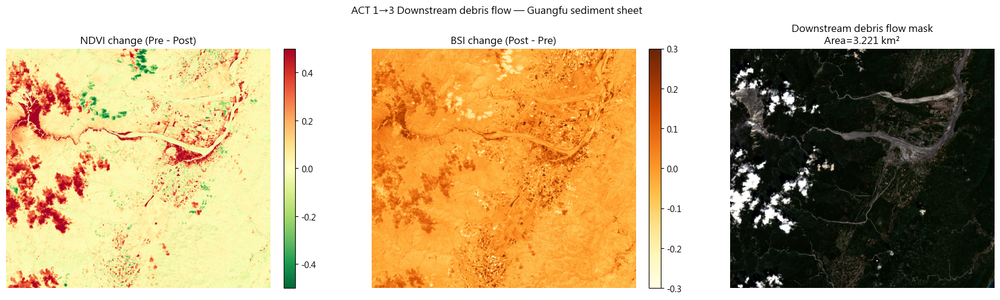

In [26]:
# [S9] Debris flow — downstream of Matai'an Creek mouth (lon > 121.35)
ndvi_change_val = ndvi_change(cube_pre, cube_post)
bsi_change_val = bsi_change(cube_pre, cube_post)
nir_pre_val = cube_pre.sel(band="B08")

_x_debris_gate, _ = Transformer.from_crs("EPSG:4326", cube_post.rio.crs, always_xy=True).transform(121.35, 23.69)
downstream_gate = cube_post.x > _x_debris_gate

debris_mask = (
    (ndvi_change_val > 0.25) &
    (bsi_change_val > 0.10) &
    (nir_pre_val > 0.20) &
    downstream_gate &
    (~lake_mask) &
    (~landslide_mask)
)

debris_km2 = pixel_area_km2(debris_mask)
print(f"✅ Debris flow area: {debris_km2:.3f} km²")

tci_post = composite_stretched(cube_post, "B04", "B03", "B02")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

im0 = axes[0].imshow(ndvi_change_val, cmap="RdYlGn_r", vmin=-0.5, vmax=0.5)
axes[0].set_title("NDVI change (Pre - Post)")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(bsi_change_val, cmap="YlOrBr", vmin=-0.3, vmax=0.3)
axes[1].set_title("BSI change (Post - Pre)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

axes[2].imshow(tci_post)
add_mask_overlay(axes[2], debris_mask, cmap="copper", alpha=0.75)
axes[2].set_title(f"Downstream debris flow mask\nArea={debris_km2:.3f} km²")
axes[2].axis("off")

plt.suptitle("ACT 1→3 Downstream debris flow — Guangfu sediment sheet")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "09_debris_mask.png", dpi=150, bbox_inches="tight")
plt.show()

### ✏️ Discussion / 討論：Why is the debris rule different from C2?
Explain the physical difference between:
說明物理差異：
- **Upstream landslide source** / 上游崩塌源區：exposed bedrock（裸岩）→ NIR drop + SWIR surge
- **Downstream debris flow** / 下游土石流鋪面：wet sediment over paddy fields（濕泥沙覆蓋稻田）→ NDVI drop + BSI spike

Why does each need a different band combination?
為什麼各自需要不同的波段組合？

*(Write 2-3 sentences here / 寫 2-3 句)*


✅ Polygon counts
Barrier lake: 8
Landslide source: 1435
Debris flow: 92


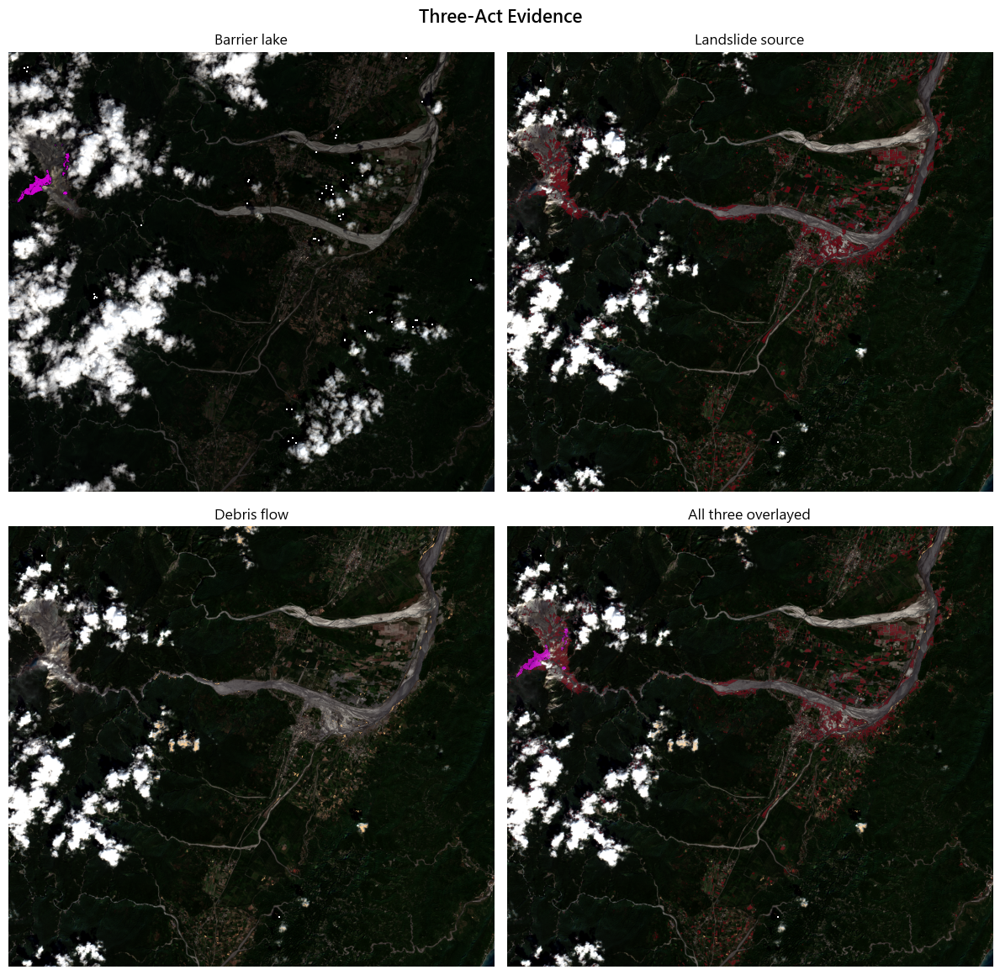

In [27]:
# [S10] Vectorize the three masks
from rasterio import features
from shapely.geometry import shape

def vectorize(mask_da, min_area=0):
    m = mask_da.fillna(False).astype("uint8").values
    polys = [
        shape(geom)
        for geom, val in features.shapes(m, mask=m.astype(bool), transform=mask_da.rio.transform())
        if val == 1
    ]
    gdf = gpd.GeoDataFrame(geometry=polys, crs=mask_da.rio.crs)
    if len(gdf) == 0:
        return gdf
    gdf["area_m2"] = gdf.geometry.area
    return gdf[gdf["area_m2"] > min_area].reset_index(drop=True)

lake_gdf = vectorize(lake_mask, min_area=3000)
landslides_gdf = vectorize(landslide_mask, min_area=2000)
debris_gdf = vectorize(debris_mask, min_area=5000)

print("✅ Polygon counts")
print("Barrier lake:", len(lake_gdf))
print("Landslide source:", len(landslides_gdf))
print("Debris flow:", len(debris_gdf))

gpkg_path = Path("mataian_detections.gpkg")
for layer_name, gdf in [
    ("barrier_lake", lake_gdf),
    ("landslide_source", landslides_gdf),
    ("debris_flow", debris_gdf),
]:
    if len(gdf) > 0:
        gdf.to_file(gpkg_path, layer=layer_name, driver="GPKG")

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
tci_mid = composite_stretched(cube_mid, "B04", "B03", "B02")
tci_post = composite_stretched(cube_post, "B04", "B03", "B02")

axes[0, 0].imshow(tci_mid)
add_mask_overlay(axes[0, 0], lake_mask, cmap="cool", alpha=0.8)
axes[0, 0].set_title("Barrier lake")
axes[0, 0].axis("off")

axes[0, 1].imshow(tci_post)
add_mask_overlay(axes[0, 1], landslide_mask, cmap="Reds", alpha=0.8)
axes[0, 1].set_title("Landslide source")
axes[0, 1].axis("off")

axes[1, 0].imshow(tci_post)
add_mask_overlay(axes[1, 0], debris_mask, cmap="copper", alpha=0.8)
axes[1, 0].set_title("Debris flow")
axes[1, 0].axis("off")

axes[1, 1].imshow(tci_post)
add_mask_overlay(axes[1, 1], lake_mask, cmap="cool", alpha=0.65)
add_mask_overlay(axes[1, 1], landslide_mask, cmap="Reds", alpha=0.65)
add_mask_overlay(axes[1, 1], debris_mask, cmap="copper", alpha=0.65)
axes[1, 1].set_title("All three overlayed")
axes[1, 1].axis("off")

plt.suptitle("Three-Act Evidence", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "10_three_masks.png", dpi=150, bbox_inches="tight")
plt.show()

## Lab 2 (cont.) — Multi-Layer Audit / 多圖層稽核


In [28]:
# [S11] Load W3 shelters, W7 bottlenecks, and W8 Guangfu overlay
from pathlib import Path

def load_optional_vector(candidates, target_crs, fallback_cols=None,
                         lon_candidates=None, lat_candidates=None, wkt_candidates=None):
    """
    Try several paths and return a GeoDataFrame.
    Supports:
    - .gpkg / .shp / .geojson
    - .csv with lon/lat columns
    - .csv with WKT geometry columns
    If nothing valid is found, return an empty GeoDataFrame.
    """
    fallback_cols = fallback_cols or {}
    lon_candidates = lon_candidates or ["lon", "longitude", "經度", "x", "X"]
    lat_candidates = lat_candidates or ["lat", "latitude", "緯度", "y", "Y"]
    wkt_candidates = wkt_candidates or ["geometry", "wkt", "WKT"]

    for p in candidates:
        p = Path(p)
        if not p.exists():
            continue

        suffix = p.suffix.lower()

        try:
            if suffix in [".gpkg", ".shp", ".geojson"]:
                gdf = gpd.read_file(p)
                if gdf.crs is None:
                    print(f"⚠️ {p} has no CRS; assuming EPSG:4326")
                    gdf = gdf.set_crs("EPSG:4326")
                gdf = gdf.to_crs(target_crs)
                print(f"✅ Loaded vector: {p}")
                return gdf

            elif suffix == ".csv":
                df = pd.read_csv(p)

                lon_col = next((c for c in lon_candidates if c in df.columns), None)
                lat_col = next((c for c in lat_candidates if c in df.columns), None)
                wkt_col = next((c for c in wkt_candidates if c in df.columns), None)

                if lon_col is not None and lat_col is not None:
                    df = df.dropna(subset=[lon_col, lat_col]).copy()
                    gdf = gpd.GeoDataFrame(
                        df,
                        geometry=gpd.points_from_xy(df[lon_col], df[lat_col]),
                        crs="EPSG:4326"
                    ).to_crs(target_crs)
                    print(f"✅ Loaded CSV as points: {p}")
                    return gdf

                if wkt_col is not None:
                    gdf = gpd.GeoDataFrame(
                        df,
                        geometry=gpd.GeoSeries.from_wkt(df[wkt_col]),
                        crs="EPSG:4326"
                    ).to_crs(target_crs)
                    print(f"✅ Loaded CSV as WKT geometry: {p}")
                    return gdf

                print(f"⚠️ CSV found but no supported geometry columns: {p}")

        except Exception as e:
            print(f"⚠️ Failed to load {p}: {e}")

    print("ℹ️ Optional dataset not found:", candidates[0] if candidates else "N/A")
    data = {k: pd.Series(dtype=v) for k, v in fallback_cols.items()}
    return gpd.GeoDataFrame(data, geometry=gpd.GeoSeries([], dtype="geometry"), crs=target_crs)

shelters = load_optional_vector(
    [
        "data/shelters.csv",
        "data/shelters_hualien.gpkg",
        "data/shelters/shelters_hualien.gpkg",
        "data/shelters_cleaned.gpkg",
        "/mnt/data/shelters.csv",
    ],
    cube_post.rio.crs,
    fallback_cols={"name": "object", "risk_level": "object"}
)

if len(shelters) > 0:
    shelters = shelters.rename(columns={
        "避難收容處所名稱": "name",
        "預計收容人數": "capacity",
        "縣市及鄉鎮市區": "admin_area",
        "風險等級": "risk_level",
    })
    if "risk_level" not in shelters.columns:
        shelters["risk_level"] = "Unknown"

top5 = load_optional_vector(
    [
        "data/top5_bottlenecks.gpkg",
        "data/top5_bottlenecks.shp",
        "data/top5_bottlenecks.csv",
        "/mnt/data/top5_bottlenecks.csv",
    ],
    cube_post.rio.crs,
    fallback_cols={"centrality_rank": "float"}
)

if len(top5) > 0:
    top5 = top5.rename(columns={
        "rank": "centrality_rank",
        "Rank": "centrality_rank",
    })

guangfu = load_optional_vector(
    [
        "data/guangfu_overlay.gpkg",
        "data/guangfu_overlay.shp",
        "data/guangfu_overlay.csv",
        "/mnt/data/guangfu_overlay.gpkg",
    ],
    cube_post.rio.crs,
    fallback_cols={"name": "object", "node_type": "object", "priority": "float"}
)

if len(guangfu) > 0:
    guangfu = guangfu.rename(columns={
        "type": "node_type",
        "Type": "node_type",
        "Priority": "priority",
    })

print("Shelters:", len(shelters), "| Top5:", len(top5), "| Guangfu:", len(guangfu))
print("CRS ->")
print("  shelters:", shelters.crs)
print("  top5    :", top5.crs)
print("  guangfu :", guangfu.crs)


✅ Loaded CSV as points: data\shelters.csv
✅ Loaded CSV as points: data\top5_bottlenecks.csv
✅ Loaded vector: data\guangfu_overlay.gpkg
Shelters: 5973 | Top5: 5 | Guangfu: 5
CRS ->
  shelters: PROJCS["WGS 84 / UTM zone 51N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",123],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32651"]]
  top5    : PROJCS["WGS 84 / UTM zone 51N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","89

Study-area shelters: 38 / 5973
Study-area top5: 0 / 5
Study-area guangfu: 5 / 5


,asset,type,location,W4_terrain_risk,W7_centrality_rank,lake_hit,landslide_hit,debris_hit,notes
0,富民社區活動中心,W3_shelter,"334114.1, 2608038.2",Unknown,,N,Y,N,
1,光復自強外役監獄,W3_shelter,"338021.9, 2610619.2",Unknown,,N,Y,N,
2,大富國小,W3_shelter,"335829.2, 2611673.6",Unknown,,N,Y,N,
3,大興活動中心,W3_shelter,"336198.9, 2614604.4",Unknown,,N,Y,N,
4,砂荖活動中心,W3_shelter,"342023.9, 2615437.2",Unknown,,N,Y,N,
5,太巴塱國小,W3_shelter,"341760.2, 2617455.7",Unknown,,N,Y,N,
6,大同活動中心,W3_shelter,"339989.2, 2617829.5",Unknown,,N,Y,N,
7,光復鄉公所,W3_shelter,"339211.3, 2618513.6",Unknown,,N,Y,N,
8,光復國中,W3_shelter,"339365.6, 2618633.7",Unknown,,N,Y,N,
9,馬太鞍社區活動中心,W3_shelter,"337051.4, 2621483.7",Unknown,,N,Y,N,


✅ Loaded local post-event preview.


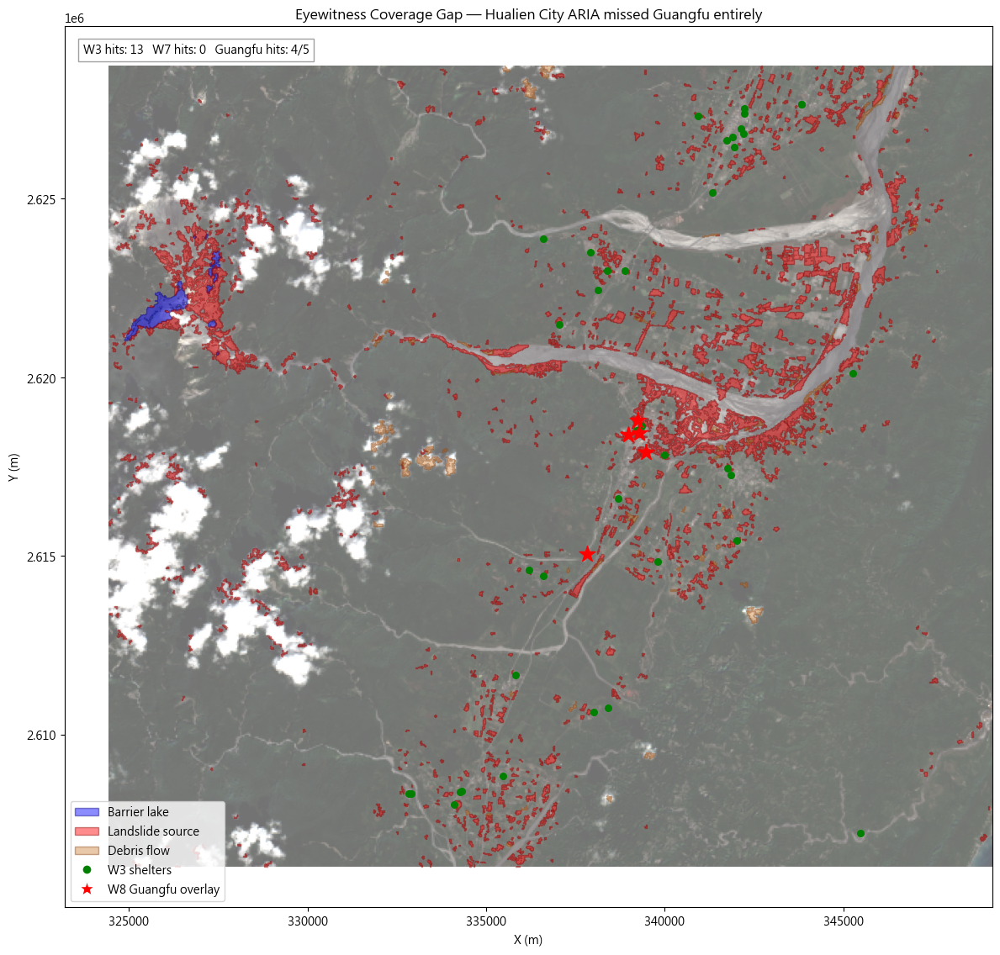

In [29]:
# [S12] Build the Eyewitness Impact Table + Final Audit Map
from shapely.ops import unary_union
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# --------------------------------------------------
# 1. Clip / subset assets to study area
# --------------------------------------------------
study_extent = gpd.GeoDataFrame(
    geometry=[box(float(cube_post.x.min()), float(cube_post.y.min()),
                  float(cube_post.x.max()), float(cube_post.y.max()))],
    crs=cube_post.rio.crs
)

def clip_to_extent(gdf, extent_gdf):
    if gdf is None or len(gdf) == 0:
        return gdf
    try:
        return gdf[gdf.intersects(extent_gdf.geometry.iloc[0])].copy()
    except Exception:
        return gdf.copy()

shelters_sub = clip_to_extent(shelters, study_extent)
top5_sub = clip_to_extent(top5, study_extent)
guangfu_sub = clip_to_extent(guangfu, study_extent)

print(f"Study-area shelters: {len(shelters_sub)} / {len(shelters)}")
print(f"Study-area top5: {len(top5_sub)} / {len(top5)}")
print(f"Study-area guangfu: {len(guangfu_sub)} / {len(guangfu)}")

# --------------------------------------------------
# 2. Build unions
# --------------------------------------------------
lake_union = unary_union(lake_gdf.geometry) if len(lake_gdf) else None
landslide_union = unary_union(landslides_gdf.geometry) if len(landslides_gdf) else None
debris_union = unary_union(debris_gdf.geometry) if len(debris_gdf) else None

def get_first_existing(row, candidates, default=None):
    for c in candidates:
        if c in row.index and pd.notna(row[c]):
            return row[c]
    return default

def geom_xy_for_label(geom):
    pt = geom if geom.geom_type == "Point" else geom.centroid
    return f"{pt.x:.1f}, {pt.y:.1f}"

def evaluate_assets(gdf, asset_type, name_candidates, risk_candidates=None, rank_candidates=None, near_ls_m=100):
    rows = []
    if gdf is None or len(gdf) == 0:
        return rows

    for idx, row in gdf.iterrows():
        geom = row.geometry
        asset_name = get_first_existing(row, name_candidates, default=f"{asset_type}_{idx}")
        risk_val = get_first_existing(row, risk_candidates or [], default="")
        rank_val = get_first_existing(row, rank_candidates or [], default="")

        lake_hit = "Y" if (lake_union is not None and geom.intersects(lake_union)) else "N"
        landslide_hit = "Y" if (landslide_union is not None and geom.distance(landslide_union) <= near_ls_m) else "N"
        debris_hit = "Y" if (debris_union is not None and geom.intersects(debris_union)) else "N"

        rows.append({
            "asset": asset_name,
            "type": asset_type,
            "location": geom_xy_for_label(geom),
            "W4_terrain_risk": risk_val,
            "W7_centrality_rank": rank_val,
            "lake_hit": lake_hit,
            "landslide_hit": landslide_hit,
            "debris_hit": debris_hit,
            "notes": "",
            "geometry": geom,
        })
    return rows

# --------------------------------------------------
# 3. Evaluate all assets
# --------------------------------------------------
impact_rows = []
impact_rows += evaluate_assets(
    shelters_sub, "W3_shelter",
    name_candidates=["name", "避難收容處所名稱", "shelter_name"],
    risk_candidates=["risk_level", "terrain_risk"],
    rank_candidates=[],
    near_ls_m=100
)
impact_rows += evaluate_assets(
    top5_sub, "W7_bottleneck",
    name_candidates=["name", "node_name"],
    risk_candidates=[],
    rank_candidates=["centrality_rank", "rank"],
    near_ls_m=200
)
impact_rows += evaluate_assets(
    guangfu_sub, "W8_guangfu_node",
    name_candidates=["name", "cn_name"],
    risk_candidates=[],
    rank_candidates=["priority"],
    near_ls_m=100
)

impact_df = pd.DataFrame(impact_rows)

# --------------------------------------------------
# 4. Sort + export table
# --------------------------------------------------
if len(impact_df) > 0:
    risk_order = {"High": 3, "Medium": 2, "Low": 1, "Unknown": 0, "": 0}
    impact_df["risk_sort"] = impact_df["W4_terrain_risk"].map(risk_order).fillna(0)

    impact_df = impact_df.sort_values(
        by=["debris_hit", "landslide_hit", "lake_hit", "risk_sort"],
        ascending=[False, False, False, False]
    ).reset_index(drop=True)

    impact_df.to_csv(OUTPUT_DIR / "impact_table.csv", index=False, encoding="utf-8-sig")
    display(impact_df.drop(columns=["geometry", "risk_sort"], errors="ignore"))
else:
    print("ℹ️ impact_df is empty because no assets overlap the study area.")

# --------------------------------------------------
# 5. Summary counts
# --------------------------------------------------
if len(impact_df) > 0:
    hit_mask = (impact_df["debris_hit"] == "Y") | (impact_df["landslide_hit"] == "Y") | (impact_df["lake_hit"] == "Y")
    n_w3 = int(((impact_df["type"] == "W3_shelter") & hit_mask).sum())
    n_w7 = int(((impact_df["type"] == "W7_bottleneck") & hit_mask).sum())
    n_guangfu = int(((impact_df["type"] == "W8_guangfu_node") & hit_mask).sum())
else:
    n_w3, n_w7, n_guangfu = 0, 0, 0

# --------------------------------------------------
# 6. Final audit map
# --------------------------------------------------
fig, ax = plt.subplots(figsize=(12, 12))
x0, x1 = float(cube_post.x.min()), float(cube_post.x.max())
y0, y1 = float(cube_post.y.min()), float(cube_post.y.max())

preview_path = OUTPUT_DIR / "post_rgb_preview.png"
if preview_path.exists():
    bg = plt.imread(preview_path)
    ax.imshow(bg, extent=[x0, x1, y0, y1], origin="upper", alpha=0.55)
    print("✅ Loaded local post-event preview.")
else:
    try:
        cube_post_preview = cube_post.coarsen(x=4, y=4, boundary="trim").mean()
        tci_post = composite_stretched(cube_post_preview, "B04", "B03", "B02")
        ax.imshow(tci_post, extent=[x0, x1, y0, y1], origin="upper", alpha=0.55)
        print("✅ Sentinel-2 background loaded with coarsened preview.")
    except Exception as e:
        print(f"⚠️ Sentinel-2 background failed to load: {e}")
        ax.set_facecolor("white")
        ax.set_xlim(x0, x1)
        ax.set_ylim(y0, y1)

if len(lake_gdf):
    lake_gdf.plot(ax=ax, color="blue", alpha=0.45, edgecolor="navy")
if len(landslides_gdf):
    landslides_gdf.plot(ax=ax, color="red", alpha=0.45, edgecolor="darkred")
if len(debris_gdf):
    debris_gdf.plot(ax=ax, color="peru", alpha=0.45, edgecolor="saddlebrown")
if len(shelters_sub):
    shelters_sub.plot(ax=ax, color="green", markersize=30, marker="o")
if len(top5_sub):
    top5_sub.plot(ax=ax, color="yellow", edgecolor="black", markersize=120, marker="o")
if len(guangfu_sub):
    guangfu_sub.plot(ax=ax, color="red", markersize=200, marker="*")

ax.text(
    0.02, 0.98,
    f"W3 hits: {n_w3}   W7 hits: {n_w7}   Guangfu hits: {n_guangfu}/{len(guangfu_sub)}",
    transform=ax.transAxes,
    va="top", ha="left",
    bbox=dict(facecolor="white", alpha=0.75, edgecolor="gray")
)

legend_elements = []
if len(lake_gdf):
    legend_elements.append(Patch(facecolor="blue", edgecolor="navy", alpha=0.45, label="Barrier lake"))
if len(landslides_gdf):
    legend_elements.append(Patch(facecolor="red", edgecolor="darkred", alpha=0.45, label="Landslide source"))
if len(debris_gdf):
    legend_elements.append(Patch(facecolor="peru", edgecolor="saddlebrown", alpha=0.45, label="Debris flow"))
if len(shelters_sub):
    legend_elements.append(Line2D([0], [0], marker="o", color="w", markerfacecolor="green",
                                  markersize=8, label="W3 shelters"))
if len(top5_sub):
    legend_elements.append(Line2D([0], [0], marker="o", color="black", markerfacecolor="yellow",
                                  markersize=10, label="W7 bottlenecks"))
if len(guangfu_sub):
    legend_elements.append(Line2D([0], [0], marker="*", color="w", markerfacecolor="red",
                                  markersize=14, label="W8 Guangfu overlay"))

ax.set_title("Eyewitness Coverage Gap — Hualien City ARIA missed Guangfu entirely")
if legend_elements:
    ax.legend(handles=legend_elements, loc="lower left")
ax.set_xlabel("X (m)")
ax.set_ylabel("Y (m)")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "12_coverage_gap_map.png", dpi=150, bbox_inches="tight")
plt.show()


### ✏️ Discussion / 討論：Coverage Gap Analysis / 覆蓋缺口分析

1. **W3 shelters hit? / W3 避難所被影響幾個？** How about W7 bottlenecks? / W7 瓶頸呢？
2. **Guangfu overlay nodes hit? / 光復圖層節點被影響幾個？** Compare the numbers. / 比較數字。
3. **What does this tell you** about the pre-event ARIA coverage zone? / 這對事前 ARIA 覆蓋範圍有什麼啟示？

*(Write your answers here / 在此作答)*


## Challenge / 挑戰題 — AI Advisor Operational Brief / AI 顧問應變簡報

Build a prompt and call any LLM to generate a 250-word operational brief.
組一個 Prompt，呼叫任何 LLM 產生 250 字的應變簡報。


In [ ]:
# [S13] Build the three-act AI Advisor prompt
if "impact_df" in globals() and isinstance(impact_df, pd.DataFrame) and len(impact_df) > 0:
    impact_md = impact_df.drop(columns=["geometry"], errors="ignore").to_markdown(index=False)
else:
    impact_md = "No optional W3/W7/W8 vector files were loaded, so the impact table is empty."

lake_km2 = pixel_area_km2(lake_mask)
landslide_km2 = pixel_area_km2(landslide_mask)
debris_km2 = pixel_area_km2(debris_mask)

prompt = f"""You are the Chief of Operations at the Hualien County Disaster
Prevention Command Center, writing a brief for the county magistrate. ARIA v5.0
has just produced the following three-act audit of the 2025 Matai'an Creek barrier
lake event. Write a 250-word operational brief covering:

1. Three-act timeline — what the imagery proves
2. The pre-breach warning window (Jul 21 to Sep 23, 64 days) — what ARIA v5.0
   could have caught if it had been operational
3. Coverage gap — why did the W3/W7 Hualien City focus miss Guangfu?
4. Next-24-hour orders: priority clearance, shelter resupply, UAV tasking
5. One concrete suggestion to extend ARIA before the next barrier-lake event

IMPACT TABLE:
{impact_md}

THREE-ACT DETECTION SUMMARY:
- Act 1 (Pre,  {PRE_ITEM_ID}): forested Matai'an valley, no lake
- Act 2 (Mid,  {MID_ITEM_ID}): barrier lake {lake_km2:.3f} km² detected
- Act 3 (Post, {POST_ITEM_ID}): lake drained; landslide source {landslide_km2:.3f} km²;
  debris flow footprint {debris_km2:.3f} km² over Guangfu
"""

print(prompt)

In [ ]:
# [S14] Call your preferred LLM — fixed, env-aware examples
# Recommended: store a real key in .env as OPENAI_API_KEY or GOOGLE_API_KEY.
# Your original AI_API_KEY variable is kept as a fallback.

# --- Example A: OpenAI SDK ---
# from openai import OpenAI
# api_key = os.getenv("OPENAI_API_KEY") or os.getenv("AI_API_KEY")
# client = OpenAI(api_key=api_key)
# resp = client.chat.completions.create(
#     model="gpt-4o-mini",
#     messages=[{"role": "user", "content": prompt}],
# )
# print(resp.choices[0].message.content)

# --- Example B: Google Gemini SDK ---
# import google.generativeai as genai
# api_key = os.getenv("GOOGLE_API_KEY") or os.getenv("AI_API_KEY")
# genai.configure(api_key=api_key)
# model = genai.GenerativeModel("gemini-1.5-flash")
# print(model.generate_content(prompt).text)

# --- Example C: Anthropic Claude SDK ---
# import anthropic
# api_key = os.getenv("ANTHROPIC_API_KEY") or os.getenv("AI_API_KEY")
# client = anthropic.Anthropic(api_key=api_key)
# resp = client.messages.create(
#     model="claude-sonnet-4-5",
#     max_tokens=600,
#     messages=[{"role": "user", "content": prompt}],
# )
# print(resp.content[0].text)

## Wrap-up Checklist / 收尾確認清單

Before leaving class, make sure you have:
離開教室前，確認你已完成：

- [ ] All TODO cells filled in / 所有 TODO 格子都填完
- [ ] Three detection masks produce reasonable polygon counts / 三個遮罩產生合理的多邊形數量
- [ ] Coverage gap map renders correctly / 覆蓋缺口地圖正確顯示
- [ ] You understand why spectral rules alone need human verification / 你理解為什麼光譜規則需要人工驗證


In [ ]:
# [S15] .env template — updated version
env_template = """
STAC_ENDPOINT=https://planetarycomputer.microsoft.com/api/stac/v1
S2_COLLECTION=sentinel-2-l2a
S2_CLOUD_MAX=20
S2_BANDS=B02,B03,B04,B08,B11,B12

MATAIAN_BBOX=121.28,23.56,121.52,23.76
TARGET_EPSG=32651

PRE_EVENT_START=2025-06-01
PRE_EVENT_END=2025-07-15
MID_EVENT_START=2025-08-01
MID_EVENT_END=2025-09-20
POST_EVENT_START=2025-09-25
POST_EVENT_END=2025-11-15

# Use one of the following:
OPENAI_API_KEY=your-openai-key-here
# GOOGLE_API_KEY=your-google-key-here
# ANTHROPIC_API_KEY=your-anthropic-key-here

# Optional backward-compatible fallback
AI_API_KEY=your-api-key-here
"""
print(env_template)

---

## Save Your Work / 儲存你的成果

Save this notebook with all cells executed. Your instructor may review it.
將此 notebook 連同所有執行結果一起儲存。老師可能會檢閱。
